In [1]:
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, _map_to_2d_cmap, plot_2d_flatmap_from_mapper
import numpy as np
import cortex
import os
import matplotlib.pyplot as plt

In [2]:
subject_scores_reading = []
subjects = ['01','02','03','05','07','08']
for eachsub in subjects:
    ceiling_voxcorrs = np.load('../Noise_Ceiling/reading/subject_'+str(eachsub)+'_kernel_ridge.npy')
    subject_scores_reading.append(ceiling_voxcorrs)

In [3]:
subject_scores_listening = []
subjects = ['01','02','03','05','07','08']
for eachsub in subjects:
    ceiling_voxcorrs = np.load('../Noise_Ceiling/listening/subject_'+str(eachsub)+'_kernel_ridge.npy')
    subject_scores_listening.append(ceiling_voxcorrs)

# Noise Ceiling Voxels 2D Colormaps

In [4]:
from voxelwise_tutorials.viz import plot_2d_flatmap_from_mapper

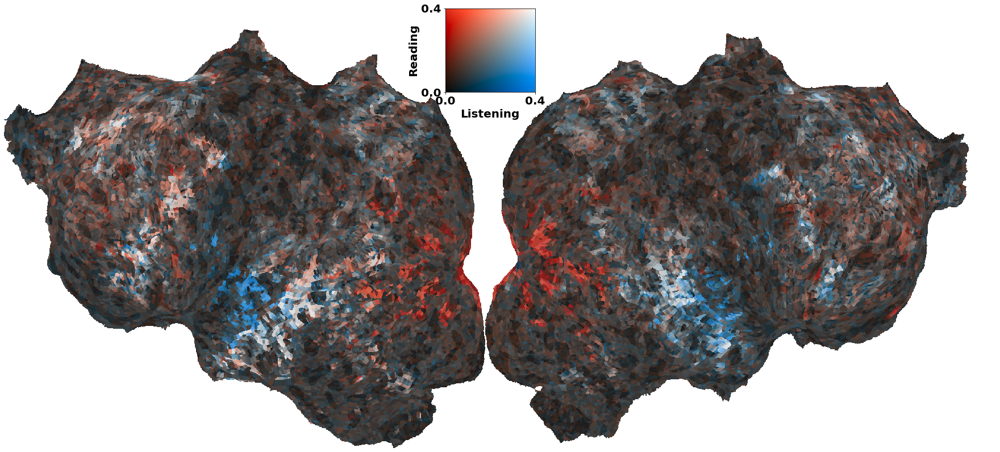

In [5]:
plt.rcParams.update({'font.size':20})
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
for i in np.arange(5,6):
    directory = './'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    ax = plot_2d_flatmap_from_mapper(subject_scores_listening[i],subject_scores_reading[i],
                                 mapper_file, vmin=0, vmax=0.4, vmin2=0,
                                 vmax2=0.4, label_1='Listening',
                                 label_2='Reading',colorbar_location=(.34, .85, .3, .2),cmap='PU_RdBu_covar', with_curvature=True, with_rois=False)
    plt.savefig('subject_noiseceiling_final_2dcolormap_'+subjects[i]+'.jpg', bbox_inches='tight')
    #plt.show()

# Noise Ceiling Voxels 1D Colormaps

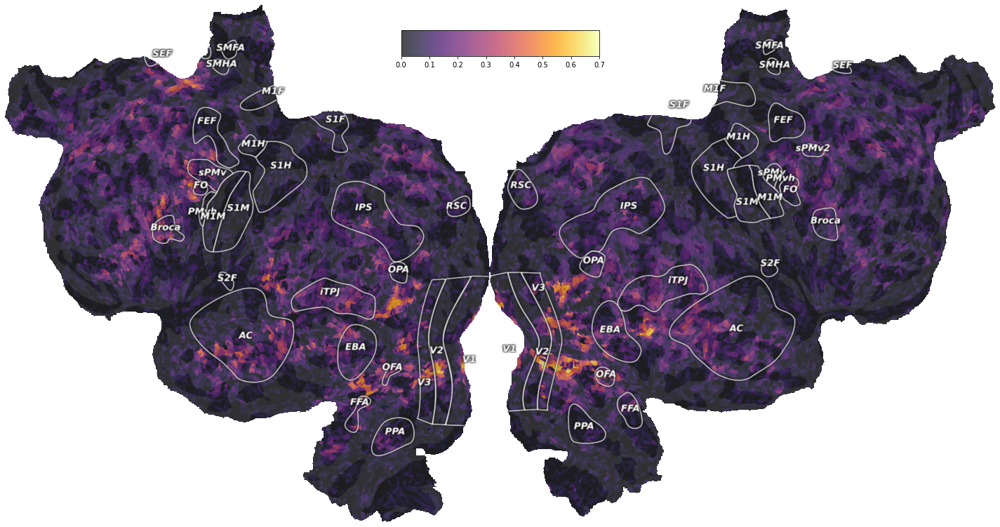

In [4]:
subject = '05'
directory = './'
mapper_file = os.path.join(directory, "mappers", f'subject{subject}_mappers.hdf')
plot_flatmap_from_mapper(reading_voxels, mapper_file, vmin=0, vmax=0.7, with_rois=True)
plt.show()

In [66]:
from voxelwise_tutorials.io import load_hdf5_sparse_array
subject = '05'
directory = '../mappers/'
mapper_file = os.path.join(directory, f'subject{subject}_mappers.hdf')
surface = "MNI"
voxel_to_fsaverage = load_hdf5_sparse_array(mapper_file,
                                            key='voxel_to_fsaverage')
ev_projected_bert = voxel_to_fsaverage @ correlation_scores[0][3]
ev_projected_wav2vec = voxel_to_fsaverage @ correlation_scores[3][3]
print("(n_vertices,) =", ev_projected_bert.shape)

(n_vertices,) = (327684,)


In [70]:
vertex1 = cortex.Vertex(ev_projected_bert, surface, vmin=0, vmax=0.4, cmap='viridis')
vertex2 = cortex.Vertex(ev_projected_wav2vec, surface, vmin=0, vmax=0.4, cmap='viridis')
vol_data = cortex.Vertex2D(ev_projected_bert, ev_projected_wav2vec, 'MNI', surface)

In [71]:
run_webshow = False
if run_webshow:
    cortex.webshow(vertex, open_browser=False, port=8050)

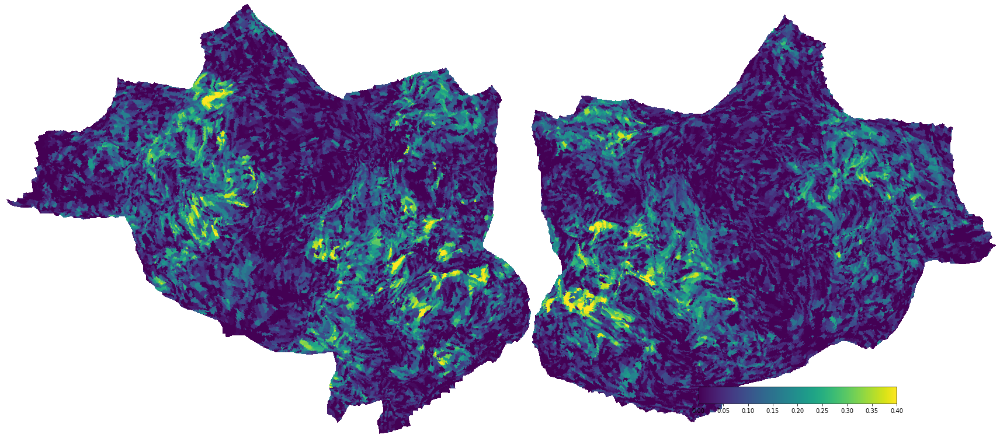

In [72]:
from cortex.testing_utils import has_installed

fig = cortex.quickshow(vertex1, colorbar_location='right',
                       with_rois=has_installed("inkscape"))
plt.show()

In [54]:
cortex.webgl.show(data={'reading':vertex1, 'listening':vertex2})

Started server on port 27013


<JS: window.viewer>

Stopping server


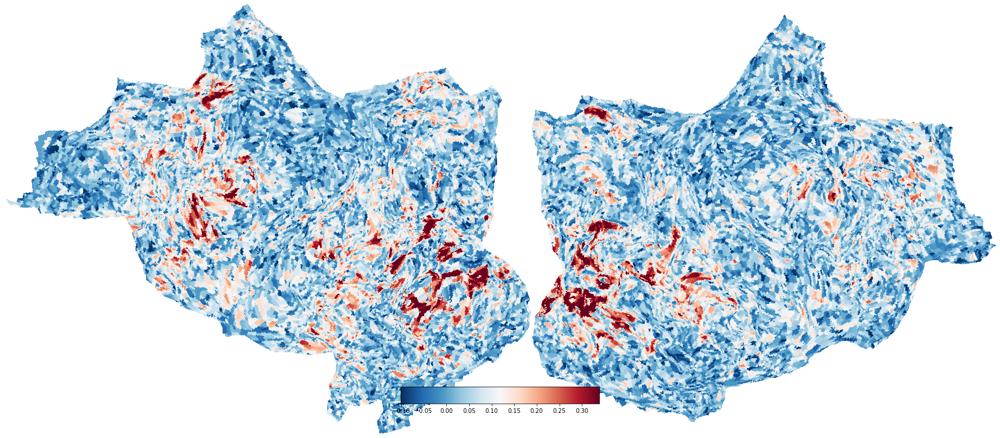

In [77]:
vertex_data = cortex.Vertex(ev_projected_wav2vec, 'MNI', with_rois=has_installed("inkscape"))
cortex.quickshow(vertex_data)
plt.show()

In [78]:
cortex.webgl.show(data=vertex_data)

Started server on port 23045


<JS: window.viewer>

Stopping server


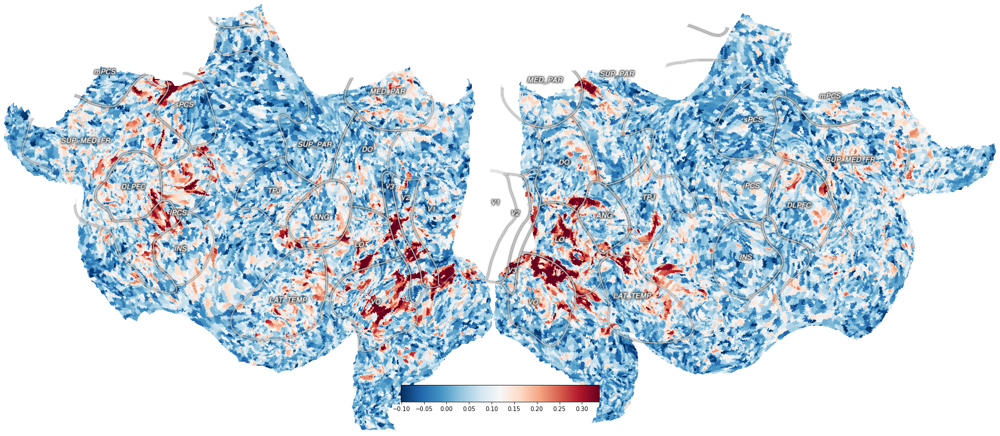

In [80]:
vertex_data = cortex.Vertex(ev_projected_wav2vec, 'pycortex_fsaverage', with_rois=has_installed("inkscape"))
cortex.quickshow(vertex_data)
plt.show()

In [81]:
cortex.webgl.show(data=vertex_data)

Started server on port 41168


<JS: window.viewer>

Stopping server


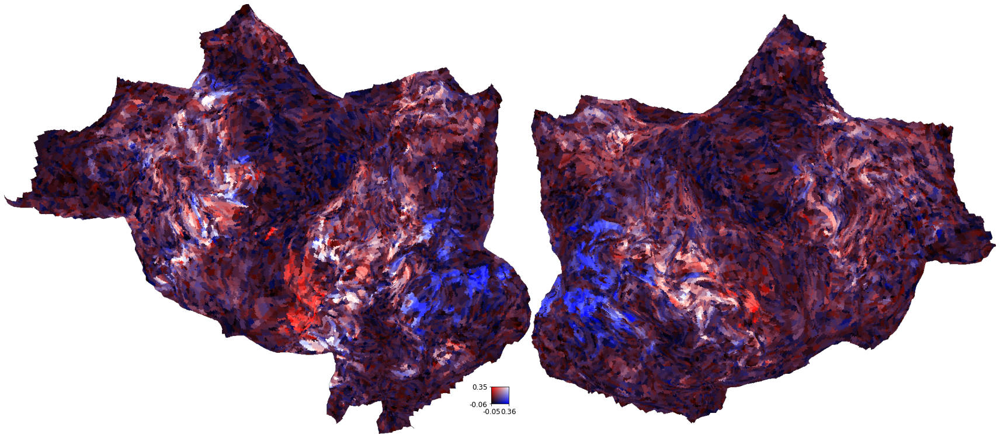

In [28]:
cortex.quickshow(vol_data)
plt.show()

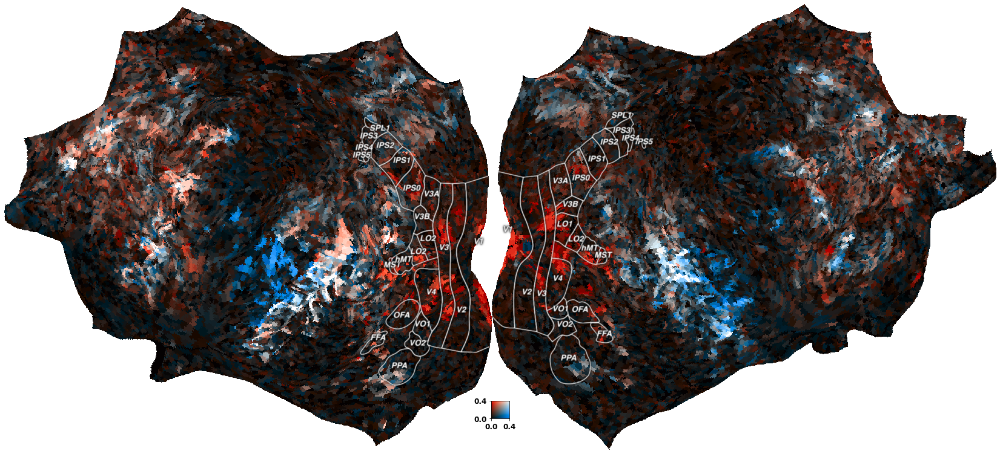

In [6]:
from voxelwise_tutorials.io import load_hdf5_sparse_array
plt.rcParams.update({'font.size':20})
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
for i in np.arange(5,6):
    directory = './'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    voxel_to_fsaverage = load_hdf5_sparse_array(mapper_file, key='voxel_to_fsaverage')
    proj_voxels = voxel_to_fsaverage @ subject_scores_listening[i]
    proj_voxels1 = voxel_to_fsaverage @ subject_scores_reading[i]
    #proj_voxels[np.where(proj_voxels<=0)[0]] = 0
    #proj_voxels1[np.where(proj_voxels1<=0)[0]] = 0
#     ax = plot_2d_flatmap_from_mapper(subject_scores_listening[i],subject_scores_reading[i],
#                                  mapper_file, vmin=0, vmax=0.4, vmin2=0,
#                                  vmax2=0.4, label_1='Listening',
#                                  label_2='Reading',colorbar_location=(.34, .85, .3, .2),cmap='RdBu_covar',  with_curvature=True)
    #plt.savefig('subject_noiseceiling_2dcolormap_'+subjects[i]+'.jpg', bbox_inches='tight')
    #plt.show()
    vertex_data = cortex.Vertex2D(proj_voxels, proj_voxels1, 'fsaverage',vmin=0,vmax=0.4,vmin2=0,vmax2=0.4,cmap="PU_RdBu_covar",colorbar_location=(.34, .85, .3, .2),with_labels=False)
    cortex.quickshow(vertex_data)
    plt.show()
    break

In [7]:
cortex.webgl.show(data=vertex_data)

Started server on port 35828
Stopping server


<JS: window.viewer>

In [28]:
plt.close()

In [8]:
# this opens a new tab and then saves the lateral and medial views
list_angles = ['left', 'right', 'medial_pivot']
cortex.export.save_3d_views(volume=vertex_data,
                    base_name='./2dmap',
                    list_angles=list_angles,
                    list_surfaces=['inflated'] * len(list_angles),
                    viewer_params=dict(labels_visible=[],
                        overlays_visible=[],
                        linewidth=3))

Started server on port 35773
{'camera.azimuth': 90, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 0, 'surface.{subject}.shift': 0, 'surface.{subject}.specularity': 0}
waiting for camera.azimuth 90.76 -> 90
waiting for camera.altitude 90.80000000000001 -> 90
[Errno 2] No such file or directory: 'convert': 'convert'
{'camera.azimuth': 270, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 0, 'surface.{subject}.shift': 0, 'surface.{subject}.specularity': 0}
[Errno 2] No such file or directory: 'convert': 'convert'
{'camera.azimuth': 0, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}
[Errno 2] No such file or directory: 'convert': 'convert'
Stopping server


['./2dmap_left_inflated.png',
 './2dmap_right_inflated.png',
 './2dmap_medial_pivot_inflated.png']